In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score as adj

df = pd.read_csv('wine.data.csv')
label = pd.Series(df['Label'])
df.drop('Label', axis=1, inplace=True)
df.head(15)

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
5,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450
6,14.39,1.87,2.45,14.6,96,2.50,2.52,0.30,1.98,5.25,1.02,3.58,1290
7,14.06,2.15,2.61,17.6,121,2.60,2.51,0.31,1.25,5.05,1.06,3.58,1295
8,14.83,1.64,2.17,14.0,97,2.80,2.98,0.29,1.98,5.20,1.08,2.85,1045
9,13.86,1.35,2.27,16.0,98,2.98,3.15,0.22,1.85,7.22,1.01,3.55,1045


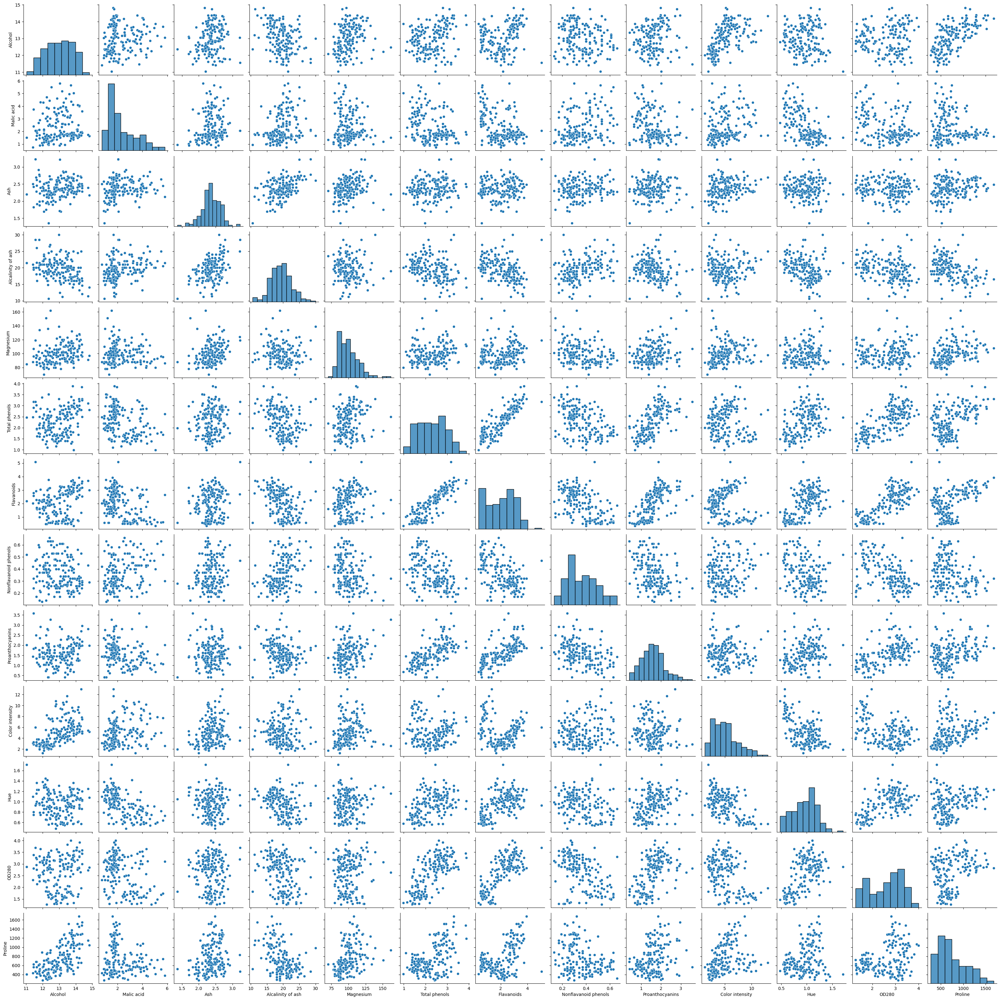

In [5]:
sns.pairplot(df)
# While some variables show little correlation, several seem to form long-shaped clusters or lines at different angles, suggesting possible relationships.

[('Total phenols', 'Flavanoids', np.float64(0.8645635000951147)),
 ('Flavanoids', 'OD280', np.float64(0.787193901866951)),
 ('Total phenols', 'OD280', np.float64(0.6999493647911861))]

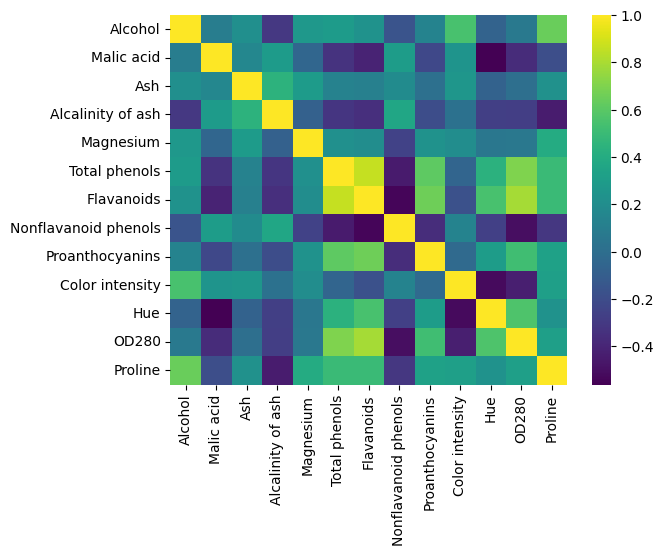

In [6]:
sns.heatmap(df.corr(),cmap="viridis")
corr = df.corr()
corrlist = []
def corrsort (element):
    return element[2]
for e,x in enumerate(corr.columns):
    for y in corr.columns[e+1:]:
        corrlist.append((x,y,corr[x][y]))
corrlist.sort(reverse=True,key=corrsort)
corrlist[:3]

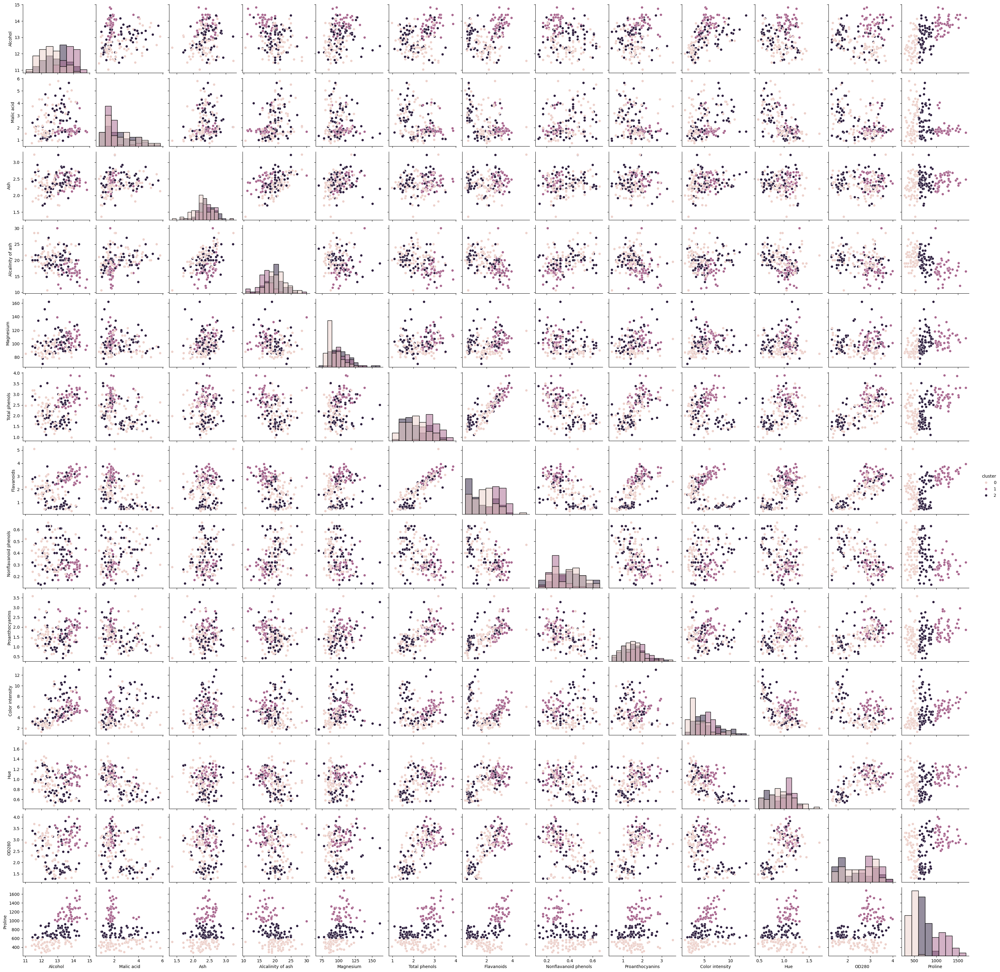

In [7]:
km = KMeans(n_clusters = 3, random_state=0).fit_predict(df)
df["cluster"] = km
sns_plot = sns.pairplot(df, hue = "cluster",diag_kind="hist")

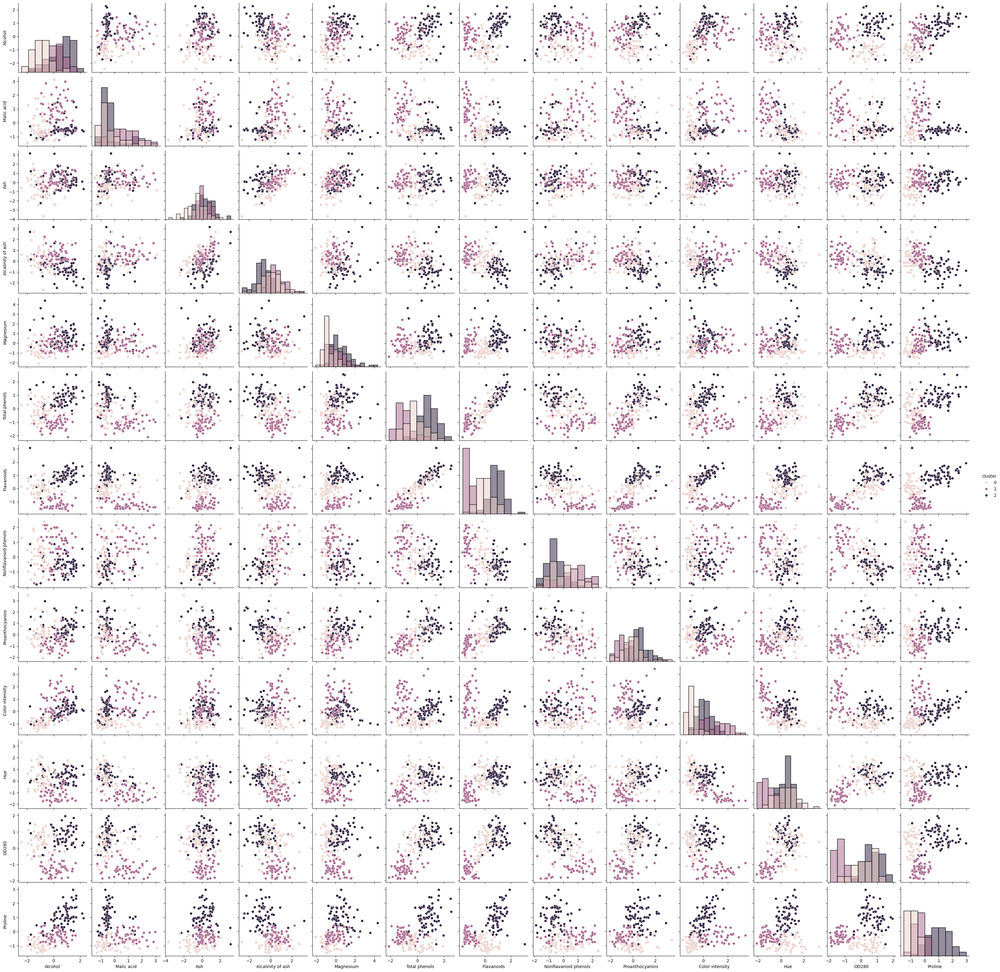

In [8]:
standardScaler = StandardScaler()
standardScaler.fit(df)
X_scaled_array = standardScaler.transform(df)
ndf = pd.DataFrame(X_scaled_array, columns = df.columns)
km = KMeans(n_clusters = 3, random_state=0).fit_predict(ndf)
ndf["cluster"] = km
sns_plot = sns.pairplot(ndf, hue = "cluster",diag_kind="hist")

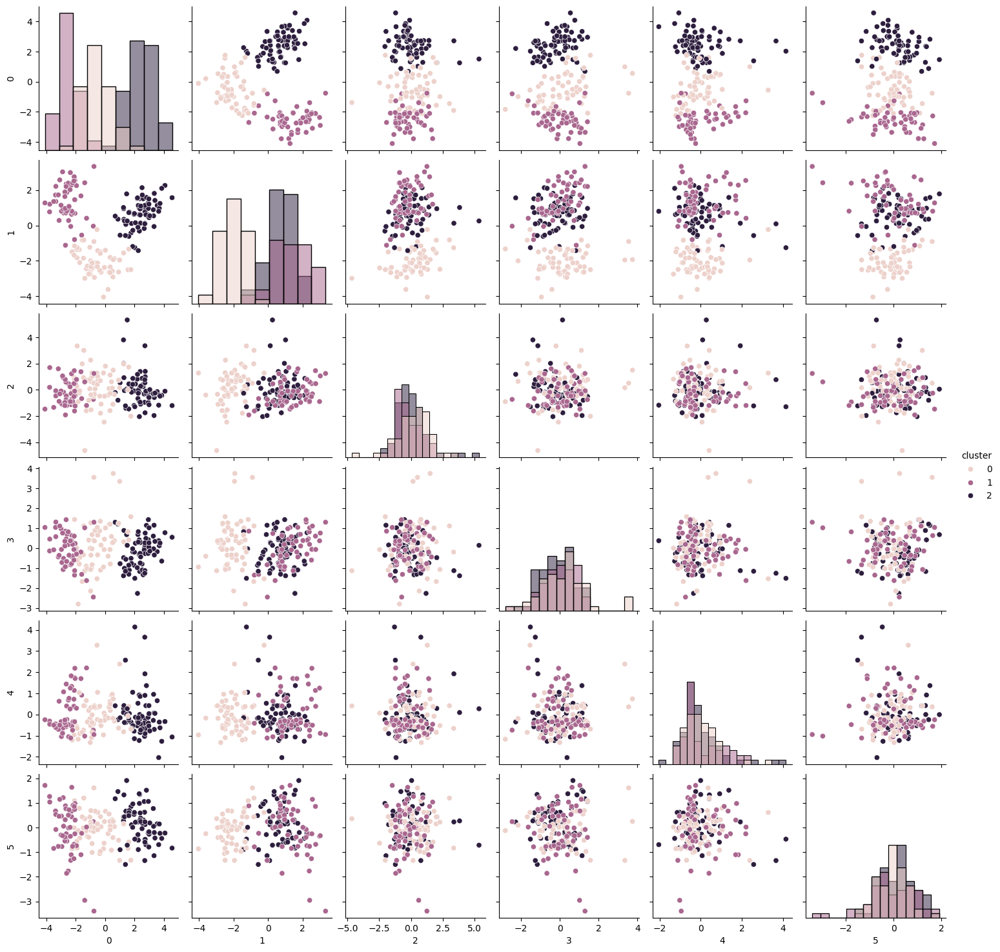

In [9]:
tdf = pd.DataFrame(PCA(n_components = 6).fit_transform(ndf))
km = KMeans(n_clusters = 3, random_state=0).fit_predict(tdf)
tdf["cluster"] = km
sns_plot = sns.pairplot(tdf, hue = "cluster",diag_kind="hist")

In [10]:
adj(label,km)
#  After normalising, and reducing the data the k-means results are quite accurate even if not perfect

0.7855540944809761

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
